In [1]:
import shutil
from glob import glob
import os
import numpy as np
import librosa
from librosa import feature
import re
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
import librosa.display
import cv2
import pylab
import pandas as pd

In [2]:
dataset = 'D:\\COVID_19_dataset\\final\\'
files = []
# r=root, d=directories, f = files
for r, d, f in os.walk(dataset):    
    for file in f:
        if '.wav' in file:
            files.append(os.path.join(r,file))

E:\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


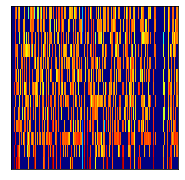

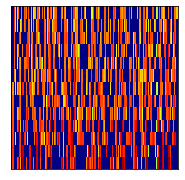

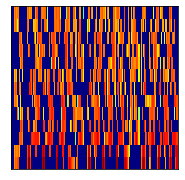

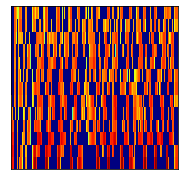

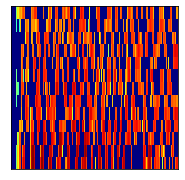

...

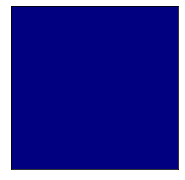

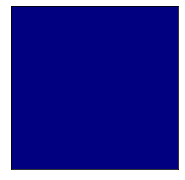

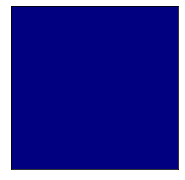

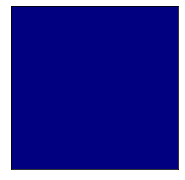

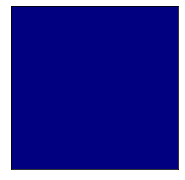

In [126]:
# image_list = []
# for f in files:
#     file_name = f.split("\\")[-1]
#     f_name = file_name.split(".")[0]
#     dir_name = f.split("\\")[3]
#     y,sr = librosa.load(f,sr=None)    
#     mfcc_feature = librosa.feature.mfcc(y,sr,n_mfcc=13,hop_length=512,n_fft=2048)
#     delta_mfccs = librosa.feature.delta(mfcc_feature)
    
#     fig = plt.figure(figsize=(3,3))
#     librosa.display.specshow(librosa.power_to_db(delta_mfccs, ref=np.max),cmap=cm.jet)
    
#     save_path = f'{f_name}.png' 
#     filepath = "D:\\COVID_19_dataset\\mfcc_images"
#     merge_path = os.path.join(filepath, dir_name)
    
#     if os.path.exists(merge_path):
#         img_path = os.path.join(merge_path, save_path)
#         pylab.savefig(img_path , bbox_inches=None, pad_inches=0)
#     else:
#         os.mkdir(merge_path)
#         img_path = os.path.join(merge_path, save_path)
#         pylab.savefig(img_path, bbox_inches=None, pad_inches=0)

In [8]:
col = ['id','a','covid_status','ep','g','l_c','l_l','l_s','rU','asthma','cough','smoker','test','ht','cold','diabetes','um','ihd','bd','st','fever','ftg','mp','loss_of_smell','test_status','diarrhoea','cld','pneumonia']
disease = pd.read_csv("https://raw.githubusercontent.com/iiscleap/Coswara-Data/master/combined_data.csv",names=col,header=None)
disease.head()

,id,a,covid_status,ep,g,l_c,l_l,l_s,rU,asthma,...,bd,st,fever,ftg,mp,loss_of_smell,test_status,diarrhoea,cld,pneumonia
0,id,a,covid_status,ep,g,l_c,l_l,l_s,rU,asthma,...,st,fever,ftg,mp,loss_of_smell,test_status,pneumonia,diarrhoea,cld,NaN
1,DRBAZX64nuVtqBQf13gH7r36Mh52,26,healthy,y,female,United States,Madison,Wisconsin,n,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Jw7YMfwGqMX22UbHh1TTgYMTYWs1,16,healthy,y,female,India,24 pargana,West Bengal,n,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,xa2v8z3Yzgb9dFrq2gEZz6oS7fh1,26,resp_illness_not_identified,y,male,India,Kolkata,West Bengal,n,True,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,xwHQrG0KwjTLJvBYVtVXfHp4JAd2,32,resp_illness_not_identified,y,male,Sri Lanka,Sri Jatawardanapura,Western Province,n,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
disease_list = disease["covid_status"].to_list()[1:]

In [13]:
id_list = disease["id"].to_list()[1:]

In [15]:
dict1 = {}
for keys in id_list:
    for value in disease_list:
        dict1[keys] = value
        disease_list.remove(value)
        break

In [17]:
mfcc_images_path = "D:\\COVID_19_dataset\\mfcc_images"
image_list = os.listdir(mfcc_images_path)

In [27]:
class_path = "D:\\COVID_19_dataset\\class"
for i in image_list:
    for keys,values in dict1.items():
        if i == keys:
            class_name = values           
            if not os.path.exists(os.path.join(class_path,class_name)):
                os.mkdir(os.path.join(class_path,class_name))
#             files = os.listdir(os.path.join(mfcc_images_path,i))
            shutil.move(os.path.join(mfcc_images_path,i),os.path.join(class_path,class_name))

            